In [1]:
#utilities
from argparse import ArgumentParser
import random
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import warnings
from typing import Any, Dict, List, Tuple, Type
from enum import Enum
from datetime import datetime

#scikit learn
from sklearn.preprocessing._data import RobustScaler
from sklearn.model_selection import train_test_split

#pytorch imports 
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset, Subset
from torch import Tensor
from torch.nn import functional as F
from torch.nn import Linear, ReLU
from torch.utils.data import Dataset, TensorDataset, DataLoader
from torch.optim import Optimizer

import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.trainer import Trainer, seed_everything
from pytorch_lightning.loggers.tensorboard import TensorBoardLogger

%load_ext autoreload
%autoreload 2
#python forecasting 
from pytorch_forecasting.data.encoders import NaNLabelEncoder, TorchNormalizer
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer, RecurrentNetwork, DeepAR
from pytorch_forecasting.models.baseline import Baseline
from pytorch_forecasting.metrics import QuantileLoss, RMSE
from pytorch_forecasting.data import GroupNormalizer
from pytorch_lightning.callbacks import ModelCheckpoint

#tensorboard 
import tensorflow as tf
import tensorboard as tb

warnings.filterwarnings('ignore')
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

import numpy as np
from sklearn.linear_model import LinearRegression

/Users/lauren/mambaforge/envs/pytorch_env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Data

In [2]:
df = pd.read_csv('dataset_3.0.csv')
TARGET = 'SCam'
TARGET_DATA = df[TARGET]

N = len(df.index)
K = math.floor(0.75 * N)



COLS = ['Cav_Amp',
 'Cav_Phs',
 'Fwd2_Amp',
 'Fwd2_Phs',
 'LP_Phase',
 'LP_Amp',
 'Fwd1_Amp',
 'Fwd1_Phs',
 'Rev_Amp',
 'Rev_Phs',
 'Spare_1300_Amp',
 'Spare_1300_Phs',
 'LCam1_Gauss_x',
 'LCam1_Gauss_y',
 'Bun2CPL3Rev-Amp',
 'Bun2CPL3Rev-Phs',
 'BunFWDCell1-Amp',
 'BunFWDCell1-Phs',
 'BunRevCell1-Amp',
 'BunRevCell1-Phs',
 'Cell1Probe-Amp',
 'Cell1Probe-Phs',
 'TCAVRev-Amp',
 'TCAVRev-Phs',
 'TCAVFWD-Amp',
 'TCAVFWD-Phs',
 'TCAVProbe-Amp',
 'TCAVProbe-Phs']

df['Group'] = pd.Series(['1.0' for x in range(N + 1)], dtype="category")
df['Time'] = pd.Series([x for x in range(N + 1)], dtype="int")


In [3]:
target = df[TARGET].values.astype(np.float64)
preds = df.drop(TARGET, axis=1)
preds = preds.values.astype(np.float64)

x_scaled = preds

x, x_val , y, y_val = x_scaled[:K, :], x_scaled[K:, :], target[:K], target[K:]

reg = LinearRegression().fit(x, y)

preds_train, preds_val = reg.predict(x), reg.predict(x_val)

train_rmse= np.sqrt(((preds_train - y) ** 2).mean())
val_rmse = np.sqrt(((preds_val - y_val) ** 2).mean())
imputed_values = np.append(preds_train, preds_val)

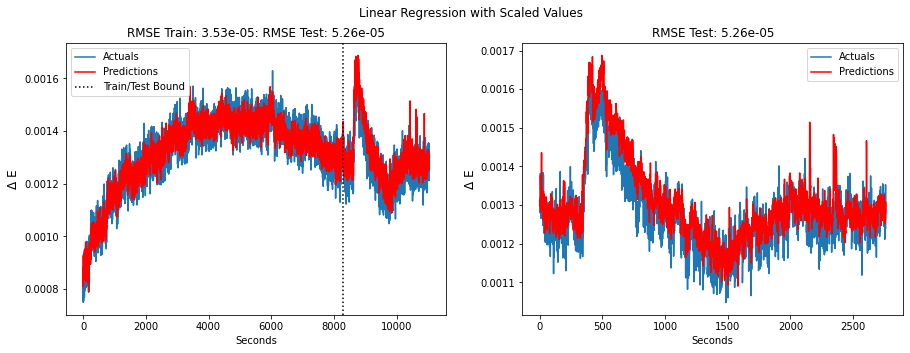

In [4]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
plt.suptitle('Linear Regression with Scaled Values')
line1, = axs[0].plot(np.append(y, y_val), label="Actuals")
line2, = axs[0].plot(np.append(preds_train, preds_val), 'r', label="Predictions")
bound = axs[0].axvline(x = K, color = 'black', linestyle='dotted', label='Train/Test Bound')
axs[0].set_ylabel('Δ E', fontsize=12)
axs[0].set_xlabel(xlabel='Seconds')
axs[0].legend(handles=[line1, line2, bound])
axs[0].set_title(f'RMSE Train: {"{0:0.2e}".format(train_rmse) }: RMSE Test: {"{0:0.2e}".format(val_rmse)}')

line1val, = axs[1].plot(y_val, label="Actuals")
line2val, = axs[1].plot(preds_val, 'r', label="Predictions")
axs[1].set_ylabel('Δ E', fontsize=12)
axs[1].set_xlabel(xlabel='Seconds')
axs[1].legend(handles=[line1val, line2val])
axs[1].set_title(f'RMSE Test: {"{0:0.2e}".format(val_rmse)}')

plt.show()

## Model Gym

### Train

In [5]:
max_encoder_length, max_prediction_length = (25, 1)

train, test  = df.copy(deep=True), df.copy(deep=True)

test[TARGET] = imputed_values

training = TimeSeriesDataSet(
    train[lambda x: x.Time <= K],
    target=TARGET,
    time_idx='Time',
    group_ids=['Group'],
    categorical_encoders={'Group': NaNLabelEncoder(), 'Time': NaNLabelEncoder()},
    static_categoricals=["Group"],
    max_encoder_length=max_encoder_length,
    min_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_unknown_reals=[TARGET],
    time_varying_known_reals=COLS, 
    target_normalizer=GroupNormalizer(method='robust', groups=["Group"])
)

validation = TimeSeriesDataSet.from_dataset(training, train[lambda x: x.Time > K], stop_randomization=True)
train_dataloader = training.to_dataloader(train=True, batch_size=32, num_workers=4)
val_dataloader = validation.to_dataloader(train=False, batch_size=1, num_workers=4)

ground_truth_test = TimeSeriesDataSet.from_dataset(training, train, stop_randomization=True)
ground_truth_dataloader = ground_truth_test.to_dataloader(train=False, batch_size=1, num_workers=4)
all_test_actuals = torch.cat([y for x, (y, weight) in iter(ground_truth_dataloader)])

test_dataset = TimeSeriesDataSet.from_dataset(training, test, stop_randomization=True)
test_dataloader = test_dataset.to_dataloader(train=False, batch_size=1, num_workers=4)

### with real validation window

In [6]:
# max_encoder_length, max_prediction_length = (25, 1)

# train, test  = df.copy(deep=True), df.copy(deep=True)

# training_cutoff = K - (10 * 60)

# test[TARGET] = imputed_values

# training = TimeSeriesDataSet(
#     train[lambda x: x.Time <= training_cutoff],
#     target=TARGET,
#     time_idx='Time',
#     group_ids=['Group'],
#     categorical_encoders={'Group': NaNLabelEncoder(), 'Time': NaNLabelEncoder()},
#     static_categoricals=["Group"],
#     max_encoder_length=max_encoder_length,
#     min_encoder_length=max_encoder_length,
#     max_prediction_length=max_prediction_length,
#     time_varying_unknown_reals=[TARGET],
#     time_varying_known_reals=COLS, 
#     target_normalizer=GroupNormalizer(method='robust', groups=["Group"])
# )

# validation = TimeSeriesDataSet.from_dataset(training, train[lambda x: (x.Time <  K) & (x.Time> training_cutoff)] , stop_randomization=True)
# train_dataloader = training.to_dataloader(train=True, batch_size=32, num_workers=4)
# val_dataloader = validation.to_dataloader(train=False, batch_size=600, num_workers=4)

# ground_truth_test = TimeSeriesDataSet.from_dataset(training, train, stop_randomization=True)
# ground_truth_dataloader = ground_truth_test.to_dataloader(train=False, batch_size=1, num_workers=4)
# all_test_actuals = torch.cat([y for x, (y, weight) in iter(ground_truth_dataloader)])

# test_dataset = TimeSeriesDataSet.from_dataset(training, test, stop_randomization=True)
# test_dataloader = test_dataset.to_dataloader(train=False, batch_size=1, num_workers=4)

In [7]:
h = random.getrandbits(32)
seed_everything(1)
logger = TensorBoardLogger("logs", name=f'Experiment_{h}')
# hparam = {"model": 'Transformer' ,  "log_interval": 25, "reduce_on_plateau_patience": 4, 'dropout': 0.2755190631427389,  "learning_rate" :0.001200708558108258,  
#           'hidden_size': 89, 'hidden_continuous_size': 9, "max_epochs": 250, 'attention_head_size': 2, "output_size": 7, 'gradient_clip_val': 0.08993007471695272}

hparam = {"model": 'Transformer' ,  "log_interval": 25, "reduce_on_plateau_patience": 4, 'dropout': 0.1190707275079647,  "learning_rate" :0.007489085100578922,  
          'hidden_size': 26, 'hidden_continuous_size':15, "max_epochs": 250, 'attention_head_size': 3, "output_size": 7, 'gradient_clip_val': 0.77146484084984}


best_model = ModelCheckpoint( monitor='val_loss', verbose=1, save_top_k=1)

early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-10, patience= 10, verbose=False, mode="min")
lr_logger = LearningRateMonitor(logging_interval="epoch")
trainer = Trainer(
  fast_dev_run=False,
  logger=logger,
  default_root_dir = 'checkpoints/',
  max_epochs=hparam['max_epochs'],
  gradient_clip_val=hparam['gradient_clip_val'],
  callbacks=[lr_logger, early_stop_callback, best_model],
)

m = TemporalFusionTransformer.from_dataset(
  training,
  hidden_size=hparam['hidden_size'],
  hidden_continuous_size = hparam['hidden_continuous_size'],
  learning_rate=hparam['learning_rate'],
  log_interval = hparam['log_interval'],
  attention_head_size=hparam['attention_head_size'],
  dropout=hparam['dropout'],
  output_size = hparam['output_size'],
  loss=QuantileLoss(quantiles = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98]),
  reduce_on_plateau_patience=hparam['reduce_on_plateau_patience']
)
 

Global seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [8]:
# from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

# # create study
# study = optimize_hyperparameters( 
#     train_dataloader,
#     val_dataloader,
#     model_path="optuna_test",
#     n_trials=200,
#     max_epochs=25,
#     gradient_clip_val_range=(0.01, 1.0),
#     hidden_size_range=(8, 128),
#     hidden_continuous_size_range=(8, 128),
#     attention_head_size_range=(1, 4),
#     learning_rate_range=(0.001, 0.1),
#     dropout_range=(0.1, 0.3),
#     trainer_kwargs=dict(limit_train_batches=30),
#     reduce_on_plateau_patience=4,
#     use_learning_rate_finder=False, 
#     loss=RMSE(quantiles = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98])
# )

In [9]:
# trainer.fit(m, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader )

In [10]:
# trainer.fit(m, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader )

# Evaluation

In [11]:
def rmse(yhats, ys):
    return torch.sqrt(torch.pow(yhats - ys, 2).mean())

In [12]:
best_model_path = "epoch=83-step=21672.ckpt"
best_m = TemporalFusionTransformer.load_from_checkpoint(best_model_path)
# best_m = m

In [13]:
train_eval_dataloader = training.to_dataloader(train=False, batch_size=32, num_workers=4)
train_predictions = best_m.predict(train_eval_dataloader)

In [14]:
all_train_actuals = torch.cat([y for x, (y, weight) in iter(train_eval_dataloader)])
train_actuals_batch_size = train_predictions.shape[1]
train_rmse = rmse(train_predictions, all_train_actuals)

f'Predictions {train_predictions.shape} Actuals {all_train_actuals.shape} RMSE {train_rmse}'

'Predictions torch.Size([8256, 1]) Actuals torch.Size([8256, 1]) RMSE 3.68914297723677e-05'

In [15]:
val_predictions = best_m.predict(val_dataloader)
all_val_actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
val_rmse = rmse(val_predictions, all_val_actuals)


f'Predictions {val_predictions.shape} Actuals {all_val_actuals.shape} RMSE {val_rmse}'

'Predictions torch.Size([2735, 1]) Actuals torch.Size([2735, 1]) RMSE 4.4907486881129444e-05'

In [16]:
test_predictions = best_m.predict(test_dataloader)
assert test_predictions.shape[1] == 1

In [17]:
test_rmse = rmse(test_predictions, all_test_actuals)
test_rmse

f'Predictions{test_predictions.shape} Actuals {all_test_actuals.shape} RNSE {test_rmse}'

'Predictionstorch.Size([11016, 1]) Actuals torch.Size([11016, 1]) RNSE 4.2609517549863085e-05'

In [18]:
TEST_INDEX = 8280

#note this isn't exactly the same as the indices of val rmse but is the same
#as the indices of val for the regression model
test_val_rmse = rmse(test_predictions[TEST_INDEX:], all_test_actuals[TEST_INDEX:])

f'Predictions{test_predictions[TEST_INDEX:].shape} Actuals {all_test_actuals[TEST_INDEX:].shape} RNSE {test_val_rmse}'

'Predictionstorch.Size([2736, 1]) Actuals torch.Size([2736, 1]) RNSE 4.889374031336047e-05'

In [19]:
test_train_rmse = rmse(test_predictions[:TEST_INDEX], all_test_actuals[:TEST_INDEX])
test_train_rmse

f'Predictions {test_predictions[TEST_INDEX:].shape} Actuals {all_test_actuals[TEST_INDEX:].shape} RNSE {test_train_rmse}'


'Predictions torch.Size([2736, 1]) Actuals torch.Size([2736, 1]) RNSE 4.031826028949581e-05'

In [20]:
raw_prediction, x = best_m.predict(
    test_dataloader,
    mode='quantiles',
    return_x = True,
)

In [21]:
SCALING_FACTOR = 4.341502134749290e-09

In [22]:
all_test_actuals[TEST_INDEX] * SCALING_FACTOR

tensor([6.0090e-12])

In [23]:
preds = np.squeeze(raw_prediction * SCALING_FACTOR , axis=1)[TEST_INDEX:, :]
#nit: python range (]
sigma1 = preds[:, 2:5]
point_preds = preds[:, 3]

In [24]:
all_test_actuals[TEST_INDEX] * SCALING_FACTOR

tensor([6.0090e-12])

In [25]:
sigma1[0]

tensor([5.4851e-12, 5.6127e-12, 5.7343e-12])

In [26]:
rmse(sigma1[2], all_test_actuals[TEST_INDEX:] * SCALING_FACTOR)

tensor(4.4689e-13)

In [27]:
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 1000

fig, axs = plt.subplots(1, 1, figsize=(15, 10))
fig.tight_layout(pad=5.0)

x = range(0, len(all_test_actuals[TEST_INDEX:]))
line1,  = axs.plot(x, all_test_actuals[TEST_INDEX:] * SCALING_FACTOR, color='blue', zorder=1, label = 'Ground Truth', alpha=0.25)
line2,  = axs.plot(x, point_preds, color='red', zorder=1, label = 'Ground Truth', alpha=0.25)



band6 = axs.fill_between(x, sigma1[:, 0], sigma1[:, 2], alpha=0.15, zorder=2, color = 'red', label = 'Predicted Quantiles')


axs.set_ylabel('Δ TOA', fontsize=12)
axs.set_xlabel(xlabel='Seconds')
axs.set_title(f'RMSE Train : {"{0:0.2e}".format(test_rmse * SCALING_FACTOR) }: RMSE Test: {"{0:0.2e}".format(test_val_rmse * SCALING_FACTOR)}', loc='left', pad = 20)
axs.legend(handles=[band6, line2, line1], loc=1, ncol=2)


plt.show()
fig.savefig('rmse-bands.png', dpi=1000)


In [28]:
np.savetxt("3_4_5_quantiles.csv", sigma1, delimiter=",")

In [38]:
'''
Visualization for both imputation and forecasting datasets
'''
import torch
import matplotlib.pyplot as plt

from  pytorch_forecasting.utils import autocorrelation
import seaborn as sns

from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt
predictions, target = torch.tensor(point_preds ), np.squeeze(all_test_actuals[TEST_INDEX:])* SCALING_FACTOR


residuals = torch.abs(torch.subtract(predictions, target)) * 1e12

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.histplot(data=residuals, kde=False, ax=axs[0], label='TFT')
axs[0].set_ylabel(ylabel='Count', fontsize=30)

plot_acf(x = residuals, lags=50, ax= axs[1], alpha=None, label='TFT', use_vlines=False, markersize=10, title=" ")
axs[1].set_ylim(-0.02, 1.2)
axs[1].set_xlabel(xlabel='Lag computed for each Observation', fontsize=30)
axs[1].set_ylabel(ylabel='Correlation ', fontsize=30)


predictions_reg, target_reg = torch.tensor(preds_val[25:]) * SCALING_FACTOR , torch.tensor(df.iloc[TEST_INDEX + 25:][TARGET].values) * SCALING_FACTOR
residuals_reg = torch.abs(torch.subtract(predictions_reg,target_reg )) * 1e12
sns.set(font_scale = 2)
sns.histplot(data=residuals_reg, kde=False, ax=axs[0], label='Regression', color='red', alpha = 0.5)
axs[0].set_xlabel(xlabel='Residual TOA(s) (ps)', fontsize=30)
axs[0].set_ylabel(ylabel='Count', fontsize=30)

axs[0].legend(frameon=True, fontsize=20)
axs[0].tick_params(axis='x', which='major', pad=15)



plot_acf(x = residuals_reg, lags=50, ax= axs[1], label='Regression',  alpha=None, use_vlines=False, markersize=10, color = 'red', title=" ")
axs[1].set_ylim(-0.02, 1.2)

axs[1].set_xlabel(xlabel='Lag', fontsize=30)
axs[1].set_ylabel(ylabel='Correlation ', fontsize=30)



axs[1].legend(frameon=True, fontsize=20)

plt.tight_layout()

plt.show()

fig.savefig('error.png', dpi=500)

In [30]:
#this is for val - can easily switch to any of the dataloaders 
raw_prediction_point, x = best_m.predict(
    val_dataloader,
    mode='raw',
    return_x = True,
)
interpretation = best_m.interpret_output(raw_prediction_point, reduction="mean")


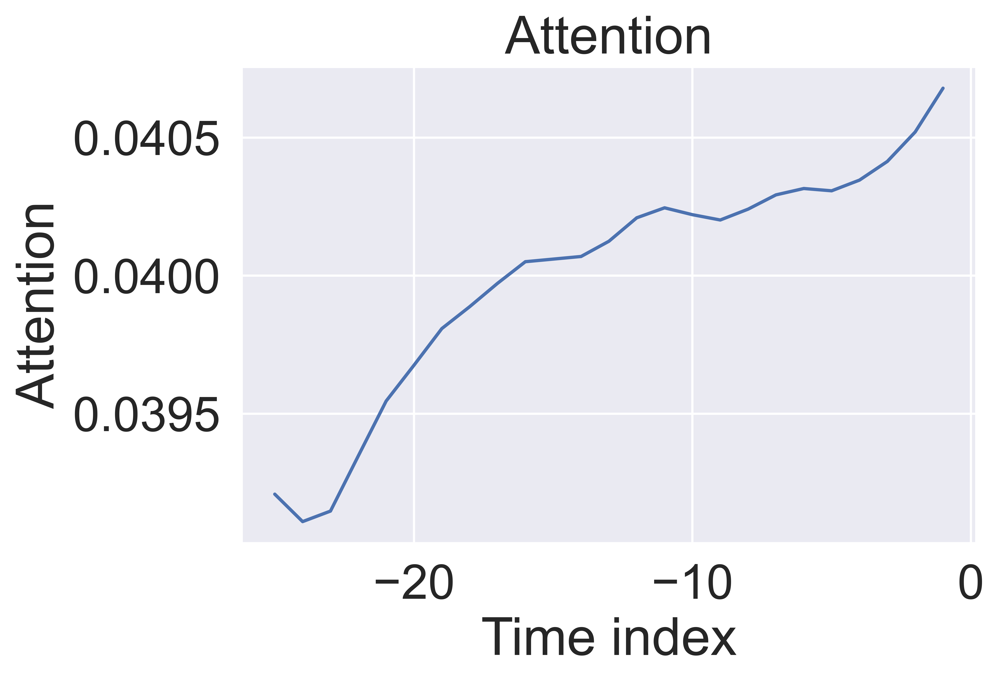

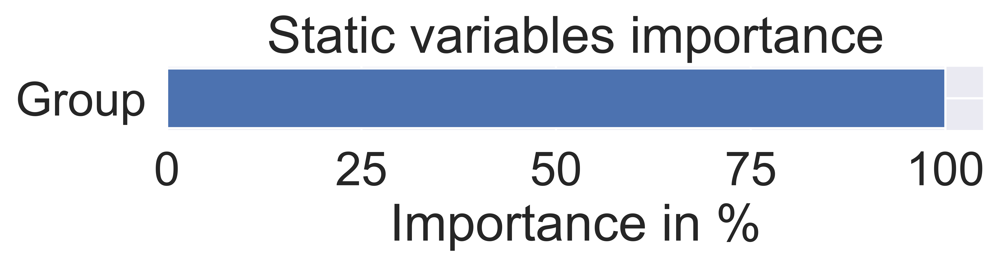

In [31]:
fig = best_m.plot_interpretation(interpretation)['decoder_variables']


In [33]:
fig.savefig('interpretation.png',  dpi=500)